<a href="https://colab.research.google.com/github/Ateneo/CLoDSA/blob/master/Dreamfields_3D_beta_v0_6_public.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Corazón Tan Blanco -3D

A toolkit to generate 3D mesh model / video / nerf instance / multiveiw images of colourful 3D objects by text and image prompts input. Edited by [Shengyu Meng (Simon)](https://twitter.com/meng_shengyu)   
Wellcome to share the outputs in social media with tag **#dreamfields3D**  😀

## Update logs

**Beta v0.6** : apply random fovy (view angle) in training; update image augmentation before feed into CLIP; improve training stability and performance. (2022-09-25)

## Credits & Changelog
Dreamfields-3D is modified from ashawkey's [dreamfields-torch](https://github.com/ashawkey/dreamfields-torch), and its forks of [IV Pravdin](https://github.com/ivpravdin) and
[Pollinations.AI](https://github.com/pollinations), released under [MIT License](https://github.com/ashawkey/dreamfields-torch/blob/main/LICENSE).

The main improvements in this notebook & repository were done by [Shengyu Meng (Simon)](https://twitter.com/meng_shengyu), including allow visualizing training process in colab, export 360° video and 3D mesh model with vertex colour, and more arguments.This code is released under [MIT License](https://github.com/shengyu-meng/dreamfields-3D/blob/main/LICENSE)

The [original dreamfields](https://ajayj.com/dreamfields) was issued under [Apache-2.0 license](https://github.com/google-research/google-research/blob/master/LICENSE), proposed by [Jain, Ajay ](https://ajayj.com/)and [Mildenhall, Ben](https://bmild.github.io/) and[ Barron, Jonathan T.](https://jonbarron.info/) and [Abbeel, Pieter](https://people.eecs.berkeley.edu/~pabbeel/) and[ Poole, Ben](https://cs.stanford.edu/~poole/) in their paper, [Zero-Shot Text-Guided Object Generation with Dream Fields](https://arxiv.org/abs/2112.01455) published on CVPR 2022. The main different of dreamfields-torch compared with original dreamfields is,  dreamfields-torch applied the [torch version of instant-ngp](https://github.com/ashawkey/torch-ngp) to replace the [original NeRF](https://github.com/bmild/nerf) as backend, and re-write most of the codes.

The technical bases of original dreamfields are [NeRF: Neural Radiance Fields](https://github.com/bmild/nerf), released under [MIT License](https://github.com/bmild/nerf/blob/master/LICENSE), proposed by Ben Mildenhall, Pratul P. Srinivasan, Matthew Tancik, Jonathan T. Barron, Ravi Ramamoorthi, Ren Ng in their paper [NeRF: Representing Scenes as Neural Radiance Fields for View Synthesis](https://arxiv.org/abs/2003.08934) published on ECCV 2020, and [CLIP: Connecting Text and Images model ](https://openai.com/blog/clip/)developed by [OpenAI](https://openai.com/), released under [MIT License](https://github.com/openai/CLIP/blob/main/LICENSE).

## check the machine

In [3]:
#@title ### Check GPU
!nvidia-smi

Sun Sep 25 22:25:19 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#@title ### Mount Google drive (otpional)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## setup

In [5]:
#@title ### pull the repostory & get working dir
import os 
!git clone https://github.com/shengyu-meng/dreamfields-3D
%cd dreamfields-3D
DC_dir = os.getcwd()

Cloning into 'dreamfields-3D'...
remote: Enumerating objects: 292, done.
remote: Counting objects: 100% (137/137), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 292 (delta 92), reused 116 (delta 75), pack-reused 155
Receiving objects: 100% (292/292), 47.10 MiB | 35.56 MiB/s, done.
Resolving deltas: 100% (154/154), done.
/content/dreamfields-3D


In [6]:
#@title install dependencies
!pip install -r requirements.txt
!bash scripts/install_ext.sh
!bash scripts/install_PyMarchingCubes.sh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-z7u6sz_6
  Running command git clone -q https://github.com/openai/CLIP.git /tmp/pip-req-build-z7u6sz_6
     |████████████████████████████████| 108 kB 5.1 MB/s 
     |████████████████████████████████| 659 kB 33.9 MB/s 
     |████████████████████████████████| 125 kB 75.7 MB/s 
     |████████████████████████████████| 235 kB 74.3 MB/s 
     |████████████████████████████████| 2.8 MB 57.8 MB/s 
     |████████████████████████████████| 53 kB 2.7 MB/s 
     |████████████████████████████████| 26.9 MB 1.5 MB/s 
     |████████████████████████████████| 56.6 MB 1.3 MB/s 
     |████████████████████████████████| 53 kB 2.1 MB/s 
     |████████████████████████████████| 51 kB 6.4 MB/s 
     |████████████████████████████████| 1.6 MB 47.5 MB/s 
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369409 sha256=d263ead26664b591a59

## Run training and test in colab

In [4]:
#@title ###Define necessary functions 

#find the path of marching_cubes
import site
import glob
import sys

def find_pm_path(pm_path = '/usr/local/lib/python3.7/dist-packages/'):
  pm_path = pm_path + "/PyMarchingCubes*/"
  path = sorted(glob.glob(pm_path), reverse=True)
  if path:
      return path[0]

pm_path = find_pm_path(site.getsitepackages()[0])
# marching_cubes_path = r"/usr/local/lib/python3.7/dist-packages/PyMarchingCubes-0.0.2-py3.7-linux-x86_64.egg" #it depend on your OS but just paste the path where is mcubes
if not pm_path in sys.path:
    sys.path.append(pm_path)    
import marching_cubes as mcubes


def get_latest_dir(path):
    dir_list = os.listdir(path)
    dir_list.sort(key=lambda x:os.path.getmtime((path+"/"+x)))
    assert len(dir_list) >= 1, "there is not previous project in present output_dir, please check the path" 
    folder_name = os.path.join(output_dir, dir_list[-1])
    folder_name  = os.path.basename(folder_name)
    return folder_name

def get_latest_file(path):
    dir_list = os.listdir(path)
    dir_list.sort(key=lambda x:os.path.getmtime((path+"/"+x)))
    return dir_list[-1]

ModuleNotFoundError: ignored

###**Training:**

Parameters introduction：

*  Use Vit-B/16 in **clip_model** and 100 in **Epoch_num** for draft training; Vit-L/14 and 200 for fine traning; the Vit-L/14 336 has not been tested yet. 
*  **Prompt_image** feature has not been fully tested yet. Because only one image prompt supported in present, sometimes it will cause mismatch.
*  set **seed** to -1 to get random seed  
*  **clip_aug** is a experimental function about augment the image before input into CLIP; seems enable it to allow more details output and when turn off will train more stable.
*  **random_fovy_training** will apply random view angle in traning, to allow CLIP to observe the render in various scale.
*  **clip_w_h** and **clip_aug_copy** will significantly afftect the GPU RAM occupation and tranining speed, try to turn-in that with different combination, suca as 232x12 \ 225x16 \ 168x20 \ 128x24 in 16G RAM GPU.
*  **use_clip_dir_text** will determine if will add the prefix to the text prompt about camera direction, such as "the font view of....". This may reduce mismath but cause over fitting.

*  larger **camerfa_fovy** amount will lead to smaller object seen in overall view.
*  set **resume_project** to "latest" to autoload the latest project in **output_dir**, otherwise indicate the specific project name.
*  The training outputs will be put in the subfolder with **project_name** plus timestamp when training start under **output_dir**; 
*  **Attention:** Sometimes the colab UI will be stuck, but if the files under checkpoints folder is keep updating, the training is still running. You could wait to it finish then restart the kernel then run the **test** stage.
*  For the full usages, please check the [main_nerf.py](https://github.com/shengyu-meng/dreamfields-3D/blob/main/main_nerf.py) for detail.

In [2]:
# from typing_extensions import Text
#@markdown ####**Training Settings:**
Prompt_text = "Corazon tan blanco" #@param{type: 'string'}
Prompt_image = "Javier Marias"  #@param{type: 'string'}
Epoch_num =  200 #@param {type: 'integer'}
learning_rate = 0.0005 #@param {type: 'number'}
render_W_H = 384  #@param {type: 'integer'}
clip_w_h = 224  #@param {type: 'integer'}
clip_aug_copy = 8 #@param {type: 'integer'}
clip_aug = True #@param {type:"boolean"}
clip_aug = "--clip_aug " if clip_aug else ""
use_clip_dir_text = False #@param {type:"boolean"}
use_clip_dir_text = "--dir_text " if use_clip_dir_text else ""
clip_model =  'ViT-L/14' #@param ['ViT-B/32','ViT-B/16','ViT-L/14','ViT-L/14@336px','RN50x16','RN50x64']
seed =  -1 #@param {type: 'integer'}
camera_fovy = 43 #@param {type: 'integer'}
random_fovy_training = True #@param {type:"boolean"}
random_fovy_training = "--rnd_fovy" if random_fovy_training else ""
##@markdown *  set seed to -1 to get random seed
resume_train = False #@param {type:"boolean"}
resume_project = "latest"  #@param{type: 'string'}
ckpt = "latest"  #@param{type: 'string'}

#@markdown ---

#@markdown ####**Output Settings:**
output_dir = "/content/drive/MyDrive/Dreamfields3D_output" #@param{type: 'string'}
project_name = "pavilion"  #@param{type: 'string'}
display_interval = 10 #@param {type: "integer"}
save_interval_img = True #@param {type:"boolean"}
save_interval_img = "--save_interval_img" if save_interval_img else ""
ckpt_save_interval = 50 #@param {type: "integer"}
mesh_resolution = 256 #@param {type: "integer"}
mesh_threshold = 10 #@param {type: "integer"}
# assign_subdir = True #@param {type:"boolean"}

#paramater conversion
import time
import os

#convert the prompt text
Prompt_text = "'" + Prompt_text + "'"
iteration = Epoch_num * 100
#get the workspace folder

try:
    DC_dir
except NameError:
    DC_dir = '/content/dreamfields-3D/'
assert os.path.isfile (DC_dir + '/main_nerf.py'), \
"wrong working folder for dreamfileds3D, please enter the right folder and run again"

if not os.path.exists(output_dir):
    os.mkdir(output_dir)

#check the parameters
assert clip_w_h % 8 ==0, f"the value of clip_w_h should be divisible by 8, but current value {clip_w_h} is not, try to use 224 or 128"

#convert the augments
if not resume_train:
  workspace = project_name + "_" + time.strftime('%Y%m%d-%H%M%S')[4:-2]

if resume_train:
  if resume_project == "latest":
    workspace = get_latest_dir(output_dir)
  else:
    workspace = resume_project

if Prompt_image != "":
  Prompt_image = "--image " +  "'" + Prompt_image + "'"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

AssertionError: ignored

++> Evaluate at epoch 180 ...

loss=-0.8112 (-0.8112): :  10% 1/10 [00:00<00:03,  2.90it/s]

[density grid] min=0.0000, max=2.8684, mean=0.0052, occ_rate=0.045 | [step counter] mean=370722


loss=-0.7879 (-0.7836): : 100% 10/10 [00:01<00:00,  7.43it/s]


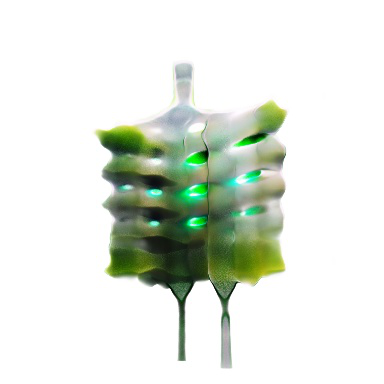
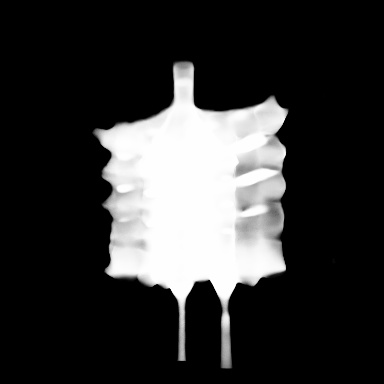
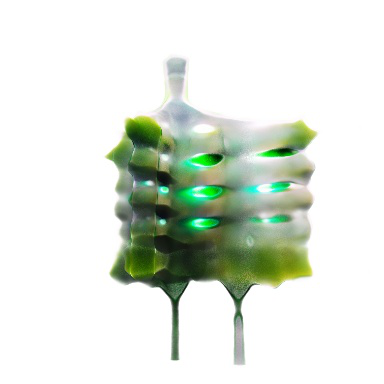
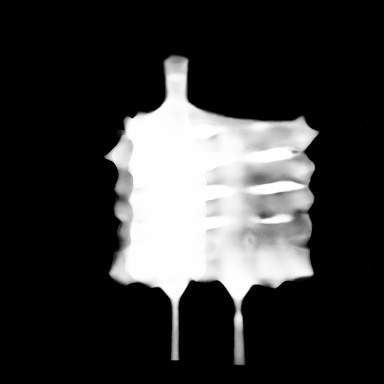
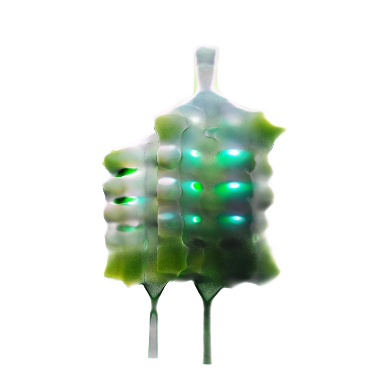
...
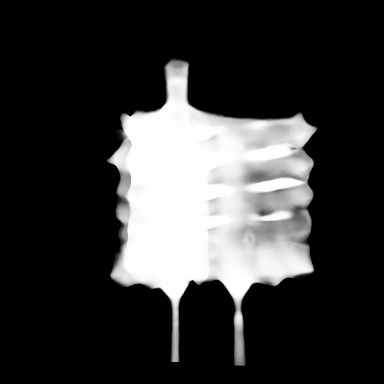
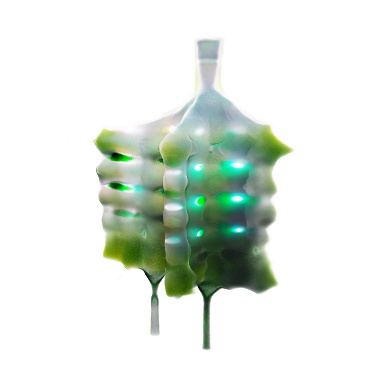
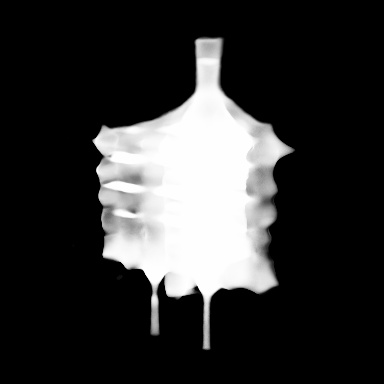
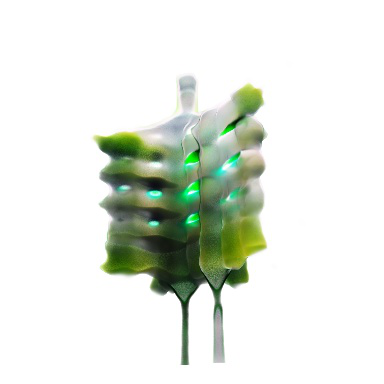
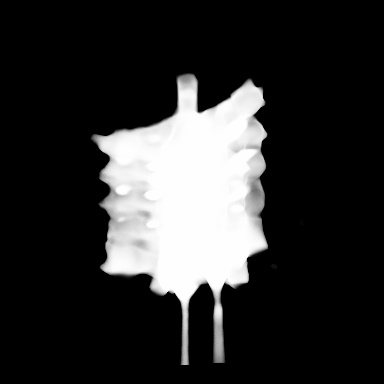

loss=-0.7879 (-0.7836): : 100% 10/10 [00:01<00:00,  5.21it/s]


++> Evaluate epoch 180 Finished.

==> Start Training Epoch 181, lr=0.000490 ...

[density grid] min=0.0000, max=3.0379, mean=0.0052, occ_rate=0.045 | [step counter] mean=370722


loss=-0.7044 (-0.7593): : 100% 100/100 [00:22<00:00,  4.42it/s]


==> Finished Epoch 181.

==> Start Training Epoch 182, lr=0.000490 ...

[density grid] min=0.0000, max=2.8860, mean=0.0053, occ_rate=0.045 | [step counter] mean=335148


loss=-0.7995 (-0.7587): : 100% 100/100 [00:22<00:00,  4.49it/s]


==> Finished Epoch 182.

==> Start Training Epoch 183, lr=0.000490 ...

[density grid] min=0.0000, max=3.2883, mean=0.0052, occ_rate=0.045 | [step counter] mean=430761


loss=-0.8169 (-0.7578): : 100% 100/100 [00:22<00:00,  4.48it/s]


==> Finished Epoch 183.

==> Start Training Epoch 184, lr=0.000490 ...

[density grid] min=0.0000, max=3.2934, mean=0.0053, occ_rate=0.045 | [step counter] mean=350163


loss=-0.8324 (-0.7588): : 100% 100/100 [00:22<00:00,  4.53it/s]


==> Finished Epoch 184.

==> Start Training Epoch 185, lr=0.000490 ...

[density grid] min=0.0000, max=3.1360, mean=0.0054, occ_rate=0.045 | [step counter] mean=347207


loss=-0.7882 (-0.7650): : 100% 100/100 [00:22<00:00,  4.42it/s]


==> Finished Epoch 185.

==> Start Training Epoch 186, lr=0.000489 ...

[density grid] min=0.0000, max=3.0532, mean=0.0052, occ_rate=0.044 | [step counter] mean=342066


loss=-0.8140 (-0.7666): : 100% 100/100 [00:22<00:00,  4.43it/s]


==> Finished Epoch 186.

==> Start Training Epoch 187, lr=0.000489 ...

[density grid] min=0.0000, max=3.3221, mean=0.0051, occ_rate=0.044 | [step counter] mean=349084


loss=-0.7683 (-0.7590): : 100% 100/100 [00:22<00:00,  4.49it/s]


==> Finished Epoch 187.

==> Start Training Epoch 188, lr=0.000489 ...

[density grid] min=0.0000, max=3.7517, mean=0.0057, occ_rate=0.046 | [step counter] mean=246764


loss=-0.8079 (-0.7622): : 100% 100/100 [00:22<00:00,  4.54it/s]


==> Finished Epoch 188.

==> Start Training Epoch 189, lr=0.000489 ...

[density grid] min=0.0000, max=3.5642, mean=0.0055, occ_rate=0.046 | [step counter] mean=345717


loss=-0.7671 (-0.7709): : 100% 100/100 [00:22<00:00,  4.37it/s]


==> Finished Epoch 189.

==> Start Training Epoch 190, lr=0.000489 ...

[density grid] min=0.0000, max=3.5082, mean=0.0054, occ_rate=0.046 | [step counter] mean=341498


loss=-0.7774 (-0.7598): : 100% 100/100 [00:22<00:00,  4.45it/s]


==> Finished Epoch 190.

++> Evaluate at epoch 190 ...

loss=-0.7791 (-0.7791): :  10% 1/10 [00:00<00:02,  3.15it/s]

[density grid] min=0.0000, max=3.3328, mean=0.0053, occ_rate=0.046 | [step counter] mean=387410


loss=-0.7807 (-0.7909): : 100% 10/10 [00:01<00:00,  7.13it/s]


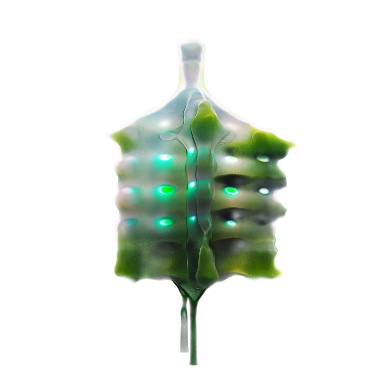
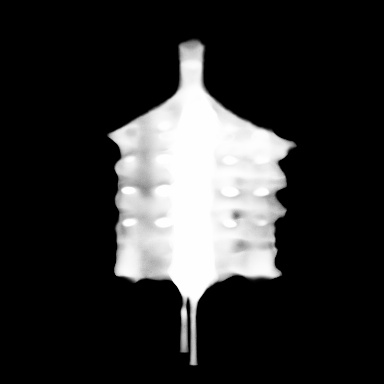
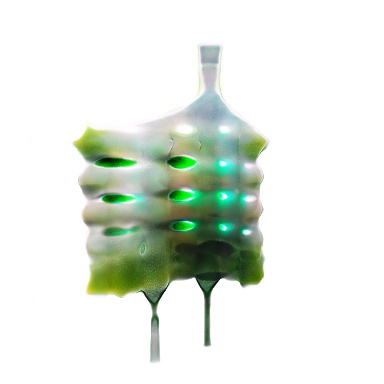
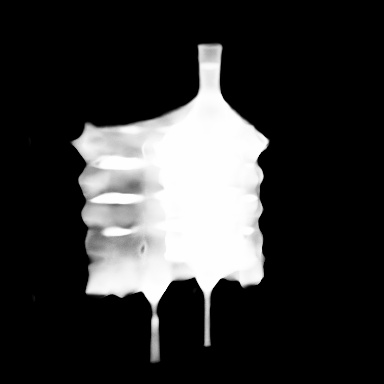
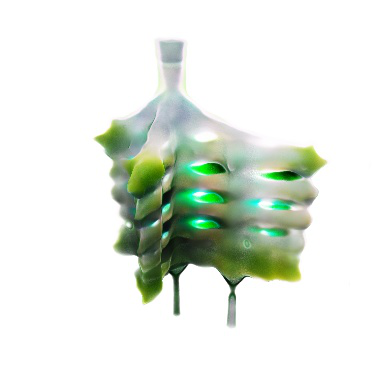
...
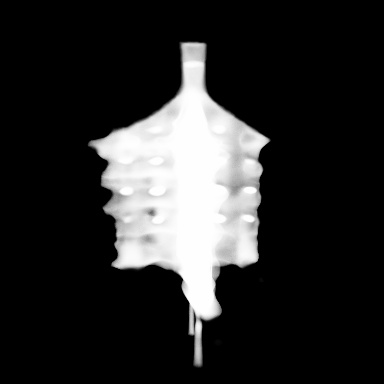
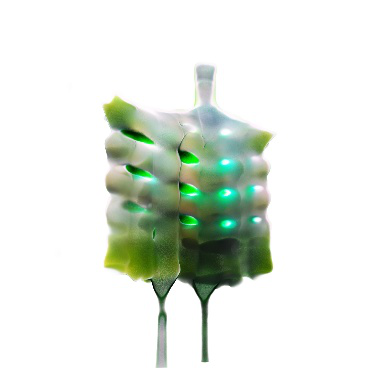
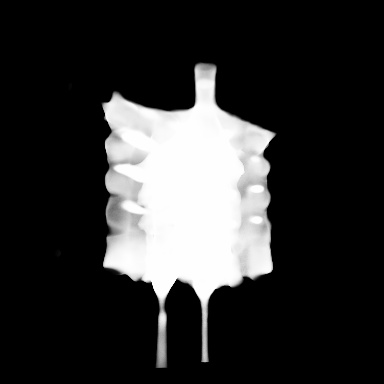
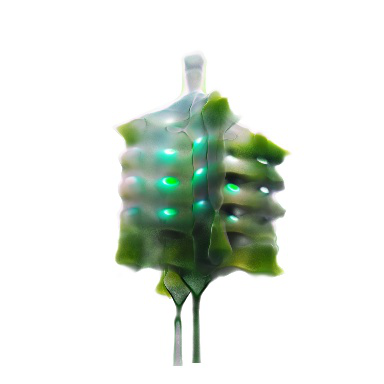
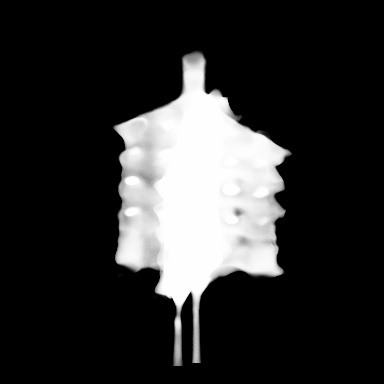

loss=-0.7807 (-0.7909): : 100% 10/10 [00:01<00:00,  5.01it/s]


++> Evaluate epoch 190 Finished.

[INFO] New best result: -0.7844637930393219 --> -0.790877389907837

==> Start Training Epoch 191, lr=0.000489 ...

[density grid] min=0.0000, max=3.3458, mean=0.0053, occ_rate=0.046 | [step counter] mean=387410


loss=-0.8287 (-0.7685): : 100% 100/100 [00:23<00:00,  4.30it/s]


==> Finished Epoch 191.

==> Start Training Epoch 192, lr=0.000489 ...

[density grid] min=0.0000, max=3.5657, mean=0.0053, occ_rate=0.045 | [step counter] mean=372817


loss=-0.6857 (-0.7636): : 100% 100/100 [00:22<00:00,  4.42it/s]


==> Finished Epoch 192.

==> Start Training Epoch 193, lr=0.000489 ...

[density grid] min=0.0000, max=3.7213, mean=0.0055, occ_rate=0.045 | [step counter] mean=365220


loss=-0.6687 (-0.7642): : 100% 100/100 [00:22<00:00,  4.40it/s]


==> Finished Epoch 193.

==> Start Training Epoch 194, lr=0.000489 ...

[density grid] min=0.0000, max=4.2558, mean=0.0057, occ_rate=0.045 | [step counter] mean=396531


loss=-0.7442 (-0.7684): : 100% 100/100 [00:22<00:00,  4.42it/s]


==> Finished Epoch 194.

==> Start Training Epoch 195, lr=0.000489 ...

[density grid] min=0.0000, max=4.0430, mean=0.0057, occ_rate=0.045 | [step counter] mean=330743


loss=-0.7753 (-0.7670): : 100% 100/100 [00:22<00:00,  4.37it/s]


==> Finished Epoch 195.

==> Start Training Epoch 196, lr=0.000489 ...

[density grid] min=0.0000, max=3.9277, mean=0.0057, occ_rate=0.045 | [step counter] mean=397645


loss=-0.7587 (-0.7668): : 100% 100/100 [00:22<00:00,  4.35it/s]


==> Finished Epoch 196.

==> Start Training Epoch 197, lr=0.000489 ...

[density grid] min=0.0000, max=4.0596, mean=0.0056, occ_rate=0.045 | [step counter] mean=380623


loss=-0.7473 (-0.7681): : 100% 100/100 [00:22<00:00,  4.39it/s]


==> Finished Epoch 197.

==> Start Training Epoch 198, lr=0.000489 ...

[density grid] min=0.0000, max=4.0258, mean=0.0055, occ_rate=0.044 | [step counter] mean=300863


loss=-0.7778 (-0.7686): : 100% 100/100 [00:22<00:00,  4.44it/s]


==> Finished Epoch 198.

==> Start Training Epoch 199, lr=0.000489 ...

[density grid] min=0.0000, max=3.8245, mean=0.0054, occ_rate=0.044 | [step counter] mean=320357


loss=-0.6632 (-0.7637): : 100% 100/100 [00:22<00:00,  4.42it/s]


==> Finished Epoch 199.

==> Start Training Epoch 200, lr=0.000489 ...

[density grid] min=0.0000, max=4.1171, mean=0.0055, occ_rate=0.044 | [step counter] mean=316227


loss=-0.7709 (-0.7757): : 100% 100/100 [00:22<00:00,  4.35it/s]


==> Finished Epoch 200.

++> Evaluate at epoch 200 ...

loss=-0.7796 (-0.7796): :  10% 1/10 [00:00<00:03,  2.81it/s]

[density grid] min=0.0000, max=3.9113, mean=0.0054, occ_rate=0.044 | [step counter] mean=398968


loss=-0.7860 (-0.7861): : 100% 10/10 [00:01<00:00,  7.36it/s]


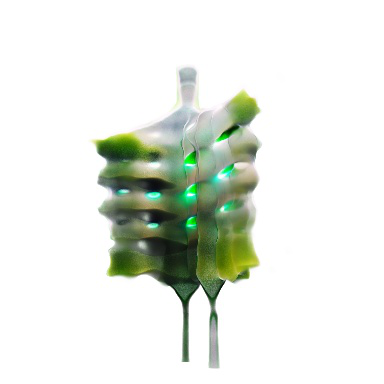
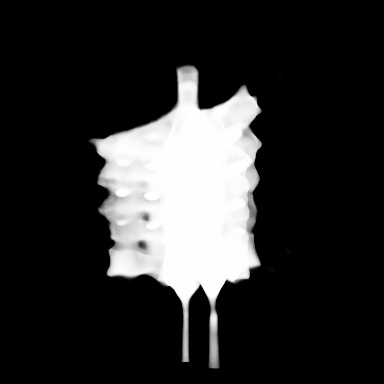
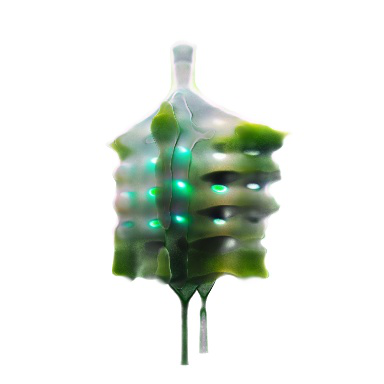
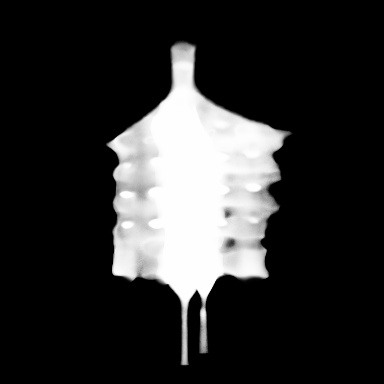
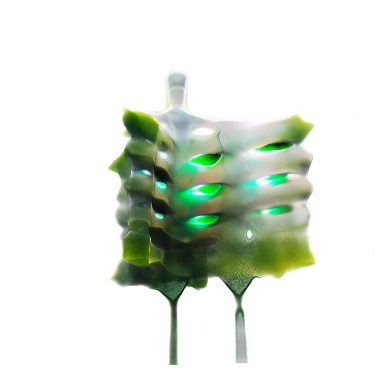
...
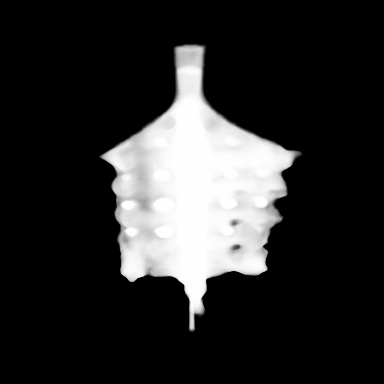
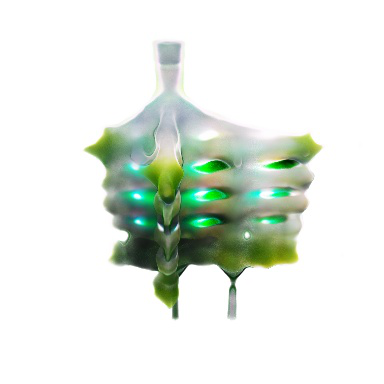
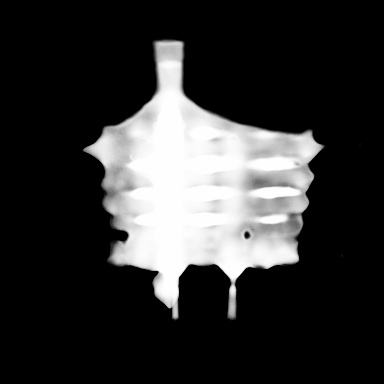
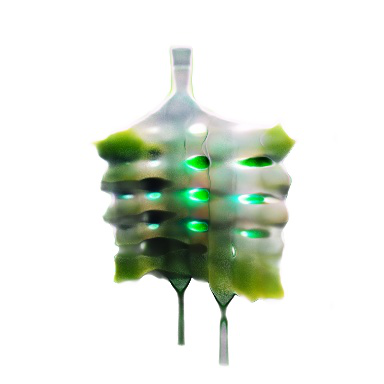
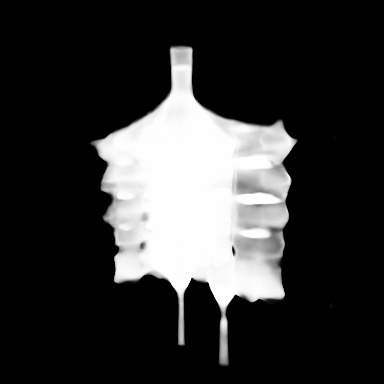

loss=-0.7860 (-0.7861): : 100% 10/10 [00:02<00:00,  4.89it/s]


++> Evaluate epoch 200 Finished.

==> Saving mesh

(256, 256, 256) 1295.0 0.0
(256, 256, 256, 3) 1.0 0.0
(3,) (3,)


==> Saving obj

export mesh:  (142730, 6)


==> Saved obj to /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/meshes/ngp_200.obj

==> saving ply

==> saved ply to  /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/meshes/ngp_200.ply

==> Finished saving mesh to /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/meshes/ngp_200.obj

==> Start Test, save results to  /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/images

 10% 1/10 [00:00<00:02,  3.22it/s]

[density grid] min=0.0000, max=4.3370, mean=0.0055, occ_rate=0.044 | [step counter] mean=398968


 90% 9/10 [00:01<00:00, 10.23it/s]

display images in   /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/images



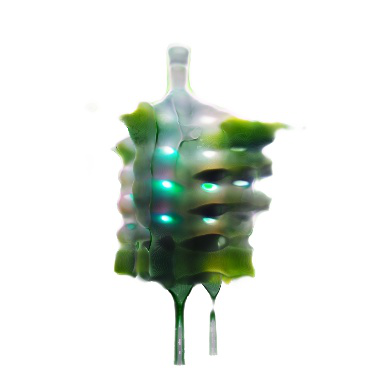
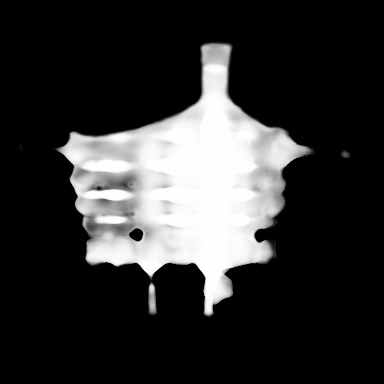
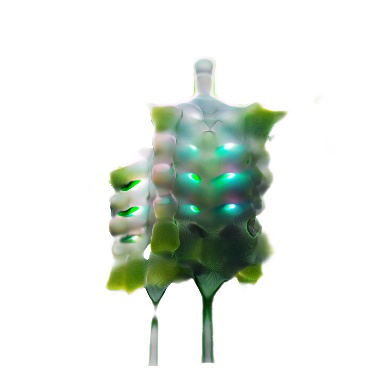
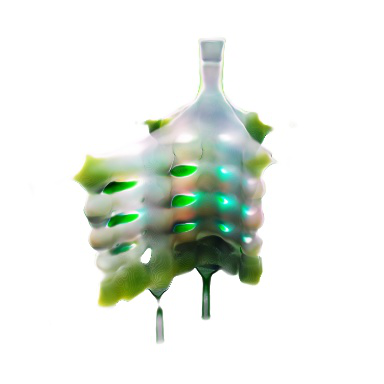
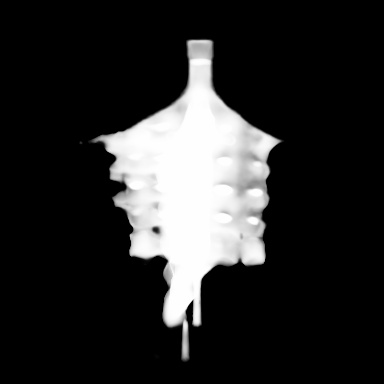
...
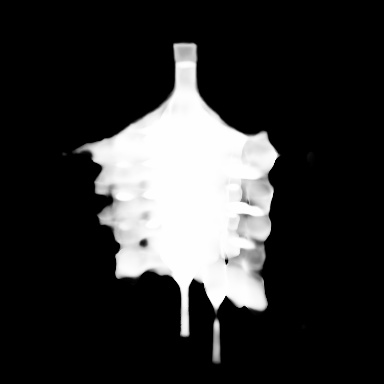
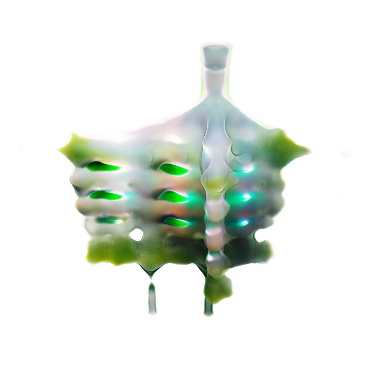
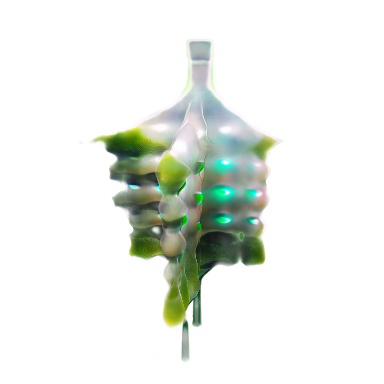
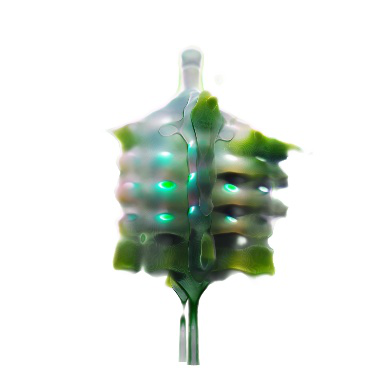
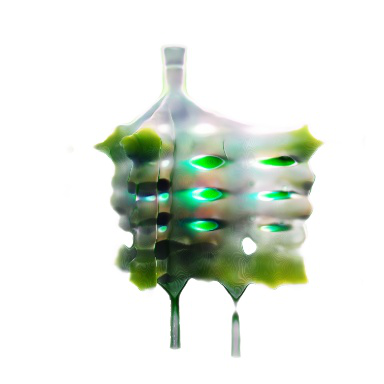

only show random 20 samples in colab. The rest out images could be found under project folder.

==> Finished Test.

100% 10/10 [00:01<00:00,  6.76it/s]

/content/dreamfields-3D


In [ ]:
#@title Training
%cd {DC_dir}

%run main_nerf.py --text {Prompt_text} {Prompt_image} --cuda_ray --fp16 --iters {iteration} --seed {seed} \
--output_dir {output_dir} --workspace {workspace} --colab --val_int {display_interval} --w {clip_w_h} --h {clip_w_h} \
--H {render_W_H} --W {render_W_H} --fovy {camera_fovy} --clip_model {clip_model} --aug_copy {clip_aug_copy}  --lr {learning_rate} \
--ckpt_save_interval {ckpt_save_interval} {save_interval_img} {use_clip_dir_text} {clip_aug} {random_fovy_training} --ckpt {ckpt}

%cd {DC_dir}

###**Test:**

Generate image / video / mesh with latest pretrained checkpoint file.

*  set **test_project** to "latest" to autoload the latest project in output_dir, otherwise indicate the folder name of specific project (include the auto generate timestamp).
*  **test_samples** will control how many images will be generate, but only 20 will be displayed in colab, please check the output folder to view all images.
*  Check the **save_video** to generate the 360° video. The Video will be 20 FPS and the total frames of video will be as same as **test_samples**.
*  Check the **save_mesh** to generate obj and ply 3D model by marching cube algorithm. 
*  The output models contain vertex colour, and could be directly view in meshlab and Rhino3D. For viewing the colour in Blender, please import the ply model (OBJ also work on latest blender 3.3), then create a new material for it, and plug a Color Attribute node into the new material in shader editor, then you should see the vertex colour.

In [ ]:
# from typing_extensions import Text
#@markdown ####**Test Settings:**
test_project = "latest"  #@param{type: 'string'}
ckpt = "latest"  #@param{type: 'string'}
test_samples = 120 #@param {type: "integer"}
render_W_H = 1024  #@param {type: 'integer'}
mesh_resolution = 256 #@param {type: "integer"}
mesh_threshold = 10 #@param {type: "integer"}
save_video = True #@param {type:"boolean"}
save_video = "--save_video" if save_video else ""
save_mesh = True #@param {type:"boolean"}
save_mesh = "--save_mesh" if save_mesh else ""

#convert the parameters
if test_project == "latest" :
  workspace = get_latest_dir(output_dir)
else:
  workspace = test_project

/content/dreamfields-3D
Namespace(H=1024, W=1024, aug_copy=8, bound=1, cc=False, ckpt='latest', ckpt_save_interval=50, clip_aug=True, clip_model='ViT-L/14', colab=True, cuda_ray=True, dir_text=False, dt_gamma=0, fovy=43.0, fp16=True, gui=False, h=224, image=None, iters=20000, lr=0.0005, max_ray_batch=4096, max_spp=64, mesh_res=256, mesh_trh=10, num_rays=4096, num_steps=512, output_dir='/content/drive/MyDrive/Dreamfields3D_output', radius=3, rnd_fovy=False, save_interval_img=True, save_mesh=True, save_video=True, seed=-1, tau_0=0.5, tau_1=0.8, tau_step=500, test=True, test_samples=120, text='a cyborg organic biological pavilion could breathe with building skin containing algae, in the style of dezeen, trending on artstation, surreal', upsample_steps=0, val_int=10, w=224, workspace='pavilion_0925-0329')
NeRFNetwork(
  (encoder): FreqEncoder()
  (sigma_net): ModuleList(
    (0): Linear(in_features=39, out_features=128, bias=False)
    (1): Linear(in_features=128, out_features=128, bias=Fa

[INFO] Training parameters:  Namespace(H=1024, W=1024, aug_copy=8, bound=1, cc=False, ckpt='latest', 
ckpt_save_interval=50, clip_aug=True, clip_model='ViT-L/14', colab=True, cuda_ray=True, dir_text=False, dt_gamma=0,
fovy=43.0, fp16=True, gui=False, h=224, image=None, iters=20000, lr=0.0005, max_ray_batch=4096, max_spp=64, 
mesh_res=256, mesh_trh=10, num_rays=4096, num_steps=512, output_dir='/content/drive/MyDrive/Dreamfields3D_output', 
radius=3, rnd_fovy=False, save_interval_img=True, save_mesh=True, save_video=True, seed=555129016, tau_0=0.5, 
tau_1=0.8, tau_step=500, test=True, test_samples=120, text='a cyborg organic biological pavilion could breathe with
building skin containing algae, in the style of dezeen, trending on artstation, surreal', upsample_steps=0, 
val_int=10, w=224, workspace='pavilion_0925-0329')

[INFO] Trainer: ngp | 2022-09-25_04-51-08 | cuda | fp16 | pavilion_0925-0329

[INFO] #parameters: 71040

[INFO] Loading latest checkpoint ...

[INFO] Latest checkpoint is pavilion_0925-0329/checkpoints/ngp_ep0200.pth.tar

[INFO] loaded model.

[INFO] load at epoch 200, global step 20000

[INFO] loaded optimizer.

[INFO] loaded scheduler.

[INFO] loaded scaler.

==> Saving mesh

(256, 256, 256) 1295.0 0.0
(256, 256, 256, 3) 1.0 0.0
(3,) (3,)


==> Saving obj

export mesh:  (142730, 6)


==> Saved obj to /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/meshes/ngp_200.obj

==> saving ply

==> saved ply to  /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/meshes/ngp_200.ply

==> Finished saving mesh to /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/meshes/ngp_200.obj

==> Start Test, save results to  /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/images

  0% 0/120 [00:00<?, ?it/s]

[density grid] min=0.0000, max=4.3370, mean=0.0056, occ_rate=0.044 | [step counter] mean=316227


100% 120/120 [00:43<00:00,  2.83it/s]

display images in   /content/drive/MyDrive/Dreamfields3D_output/pavilion_0925-0329/images



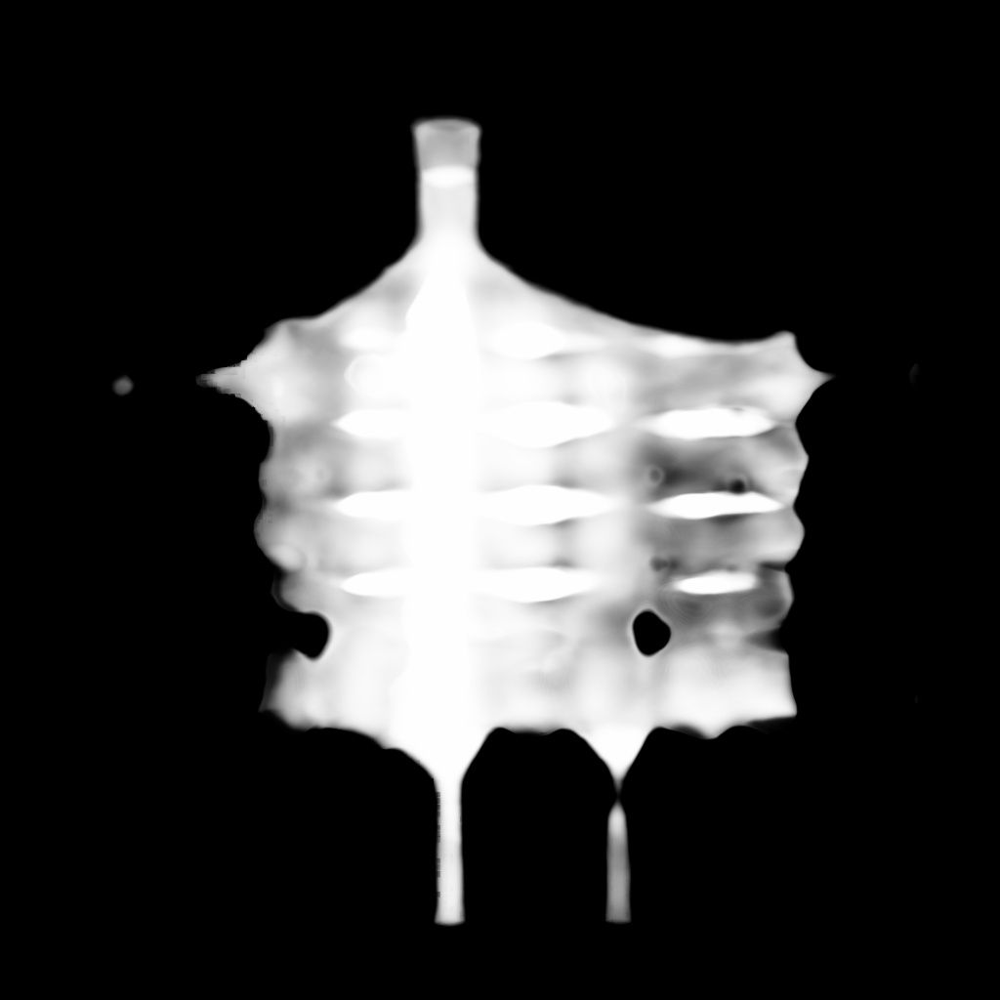
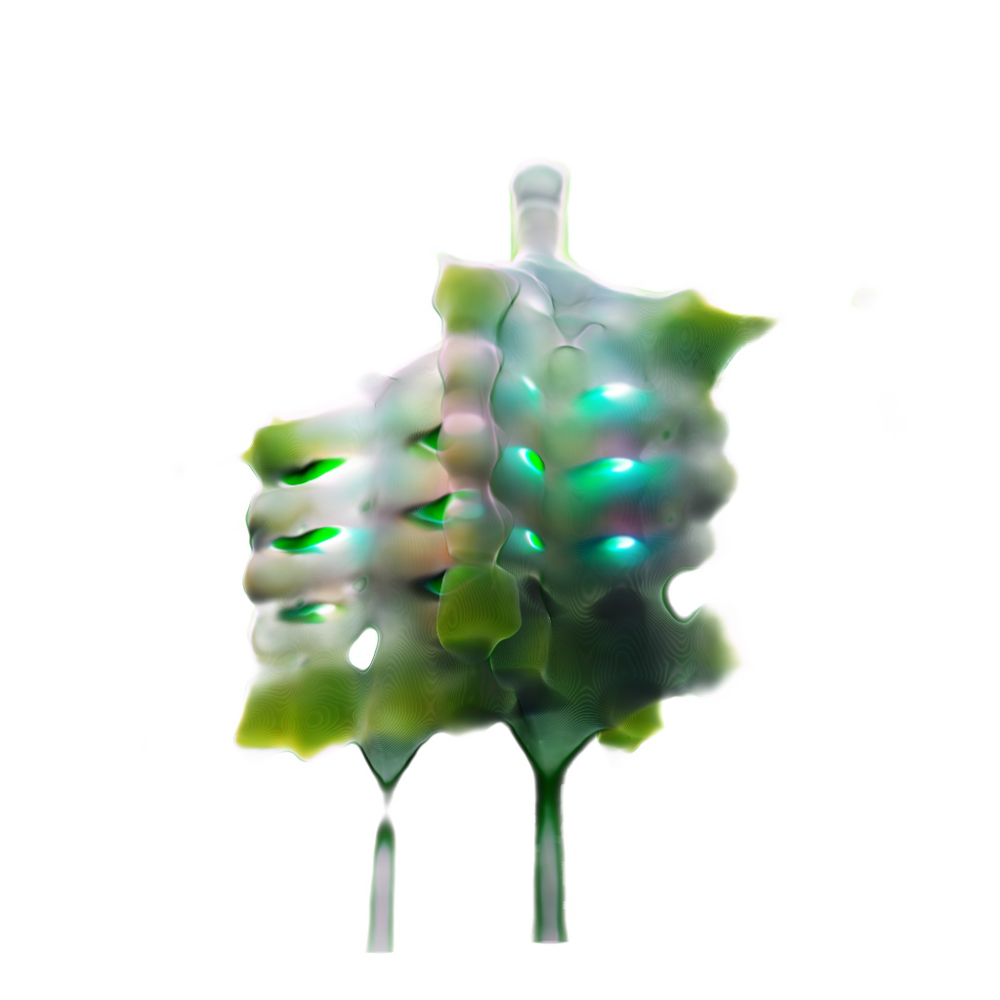
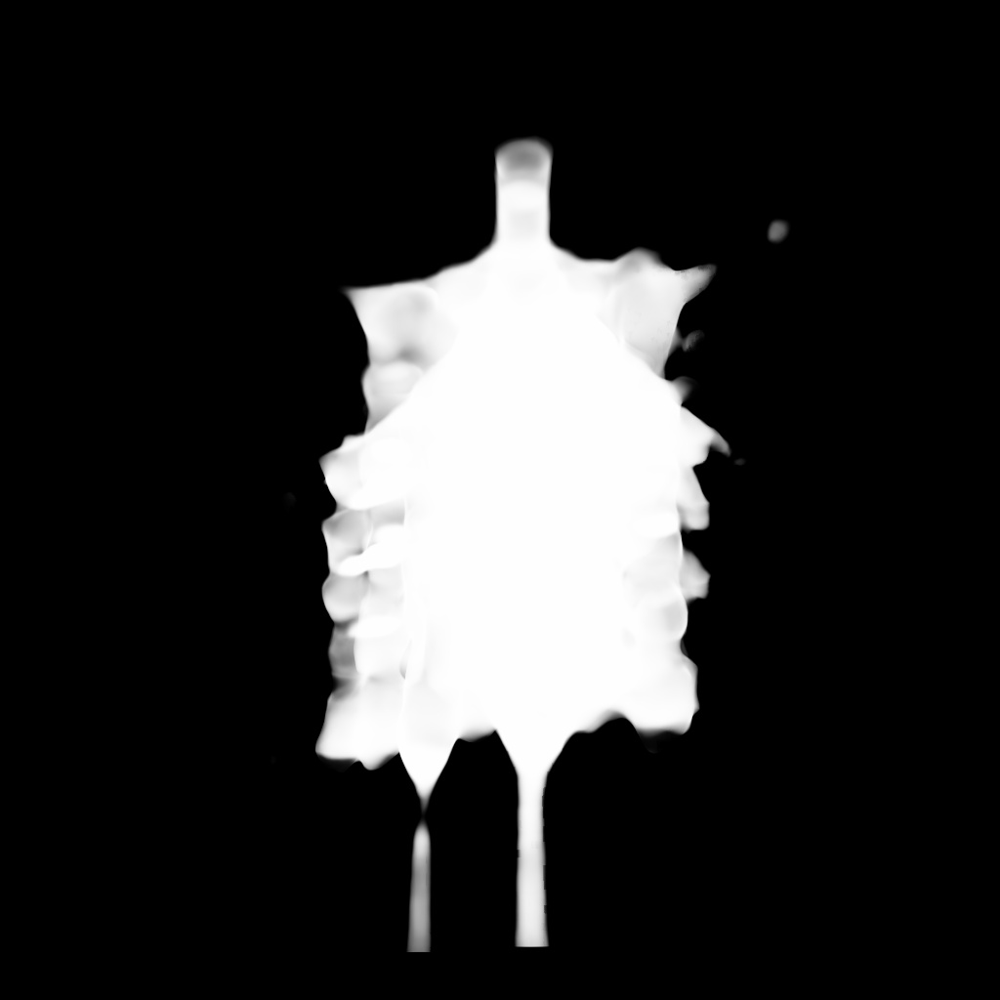
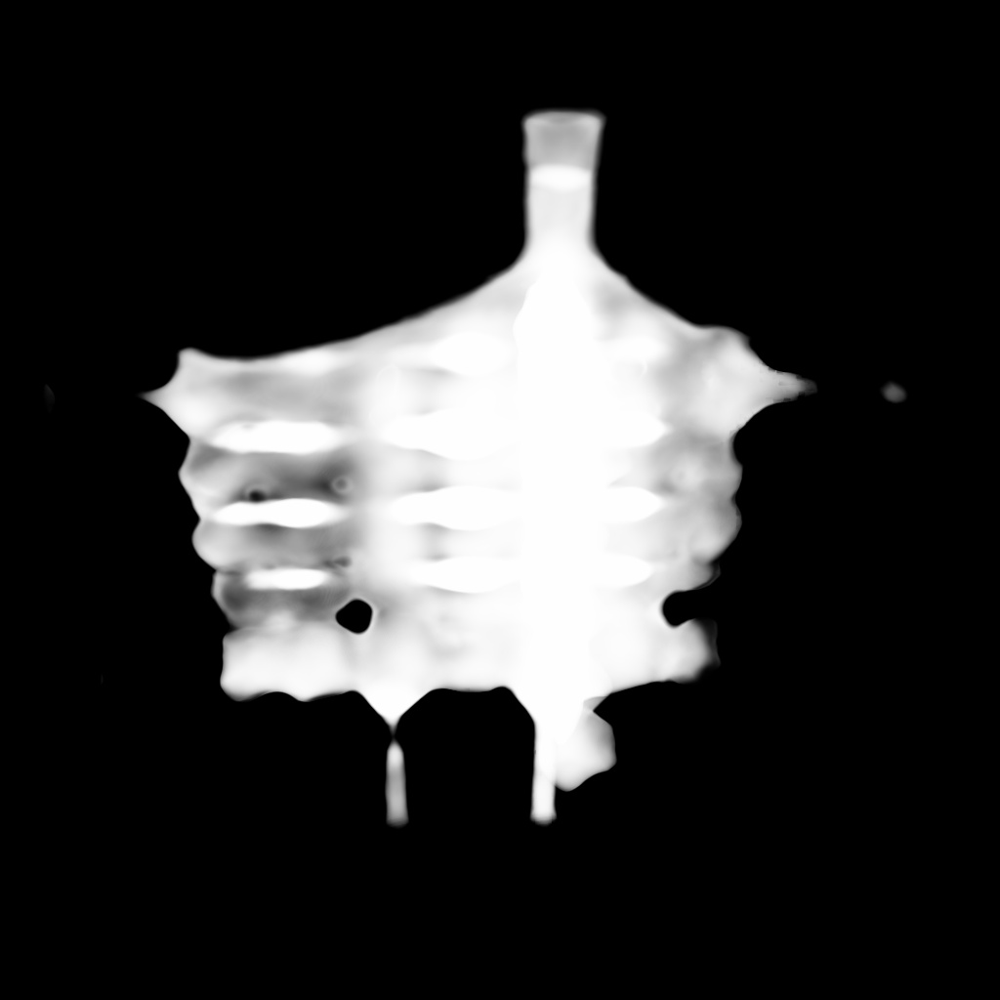
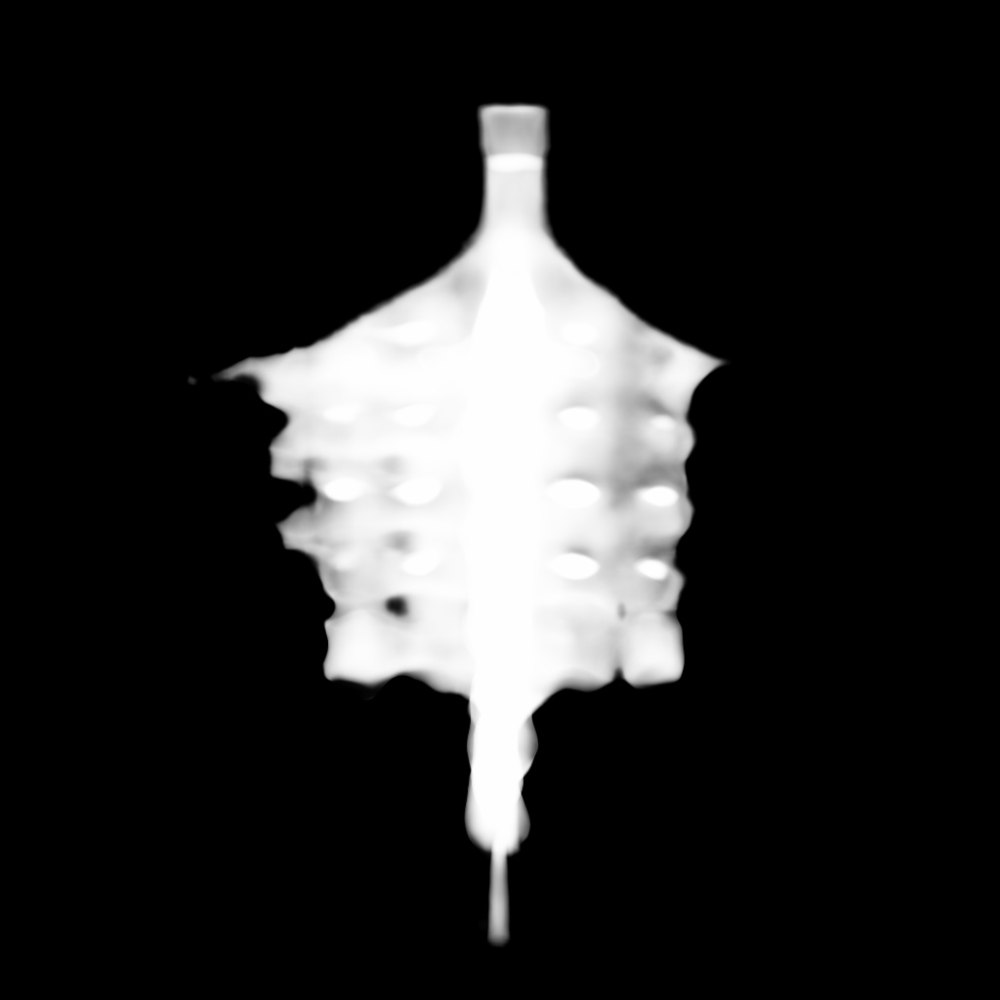
...
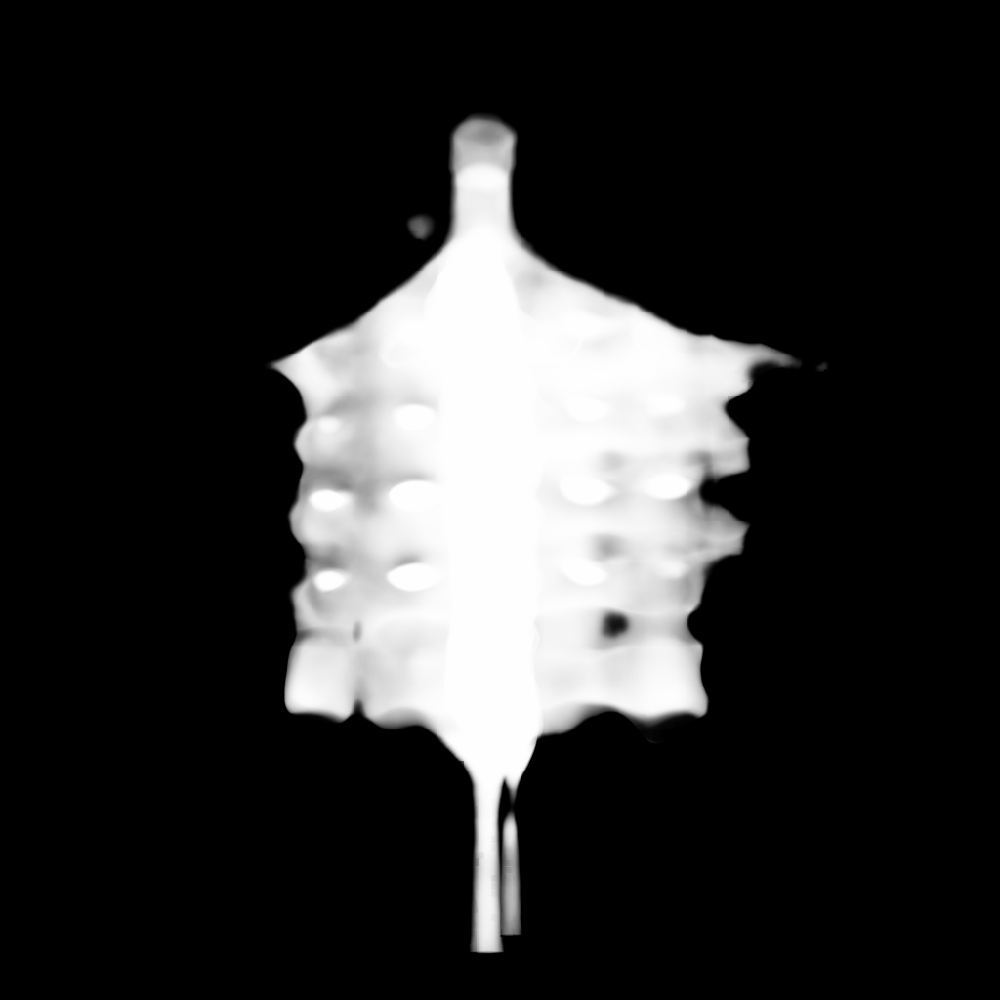
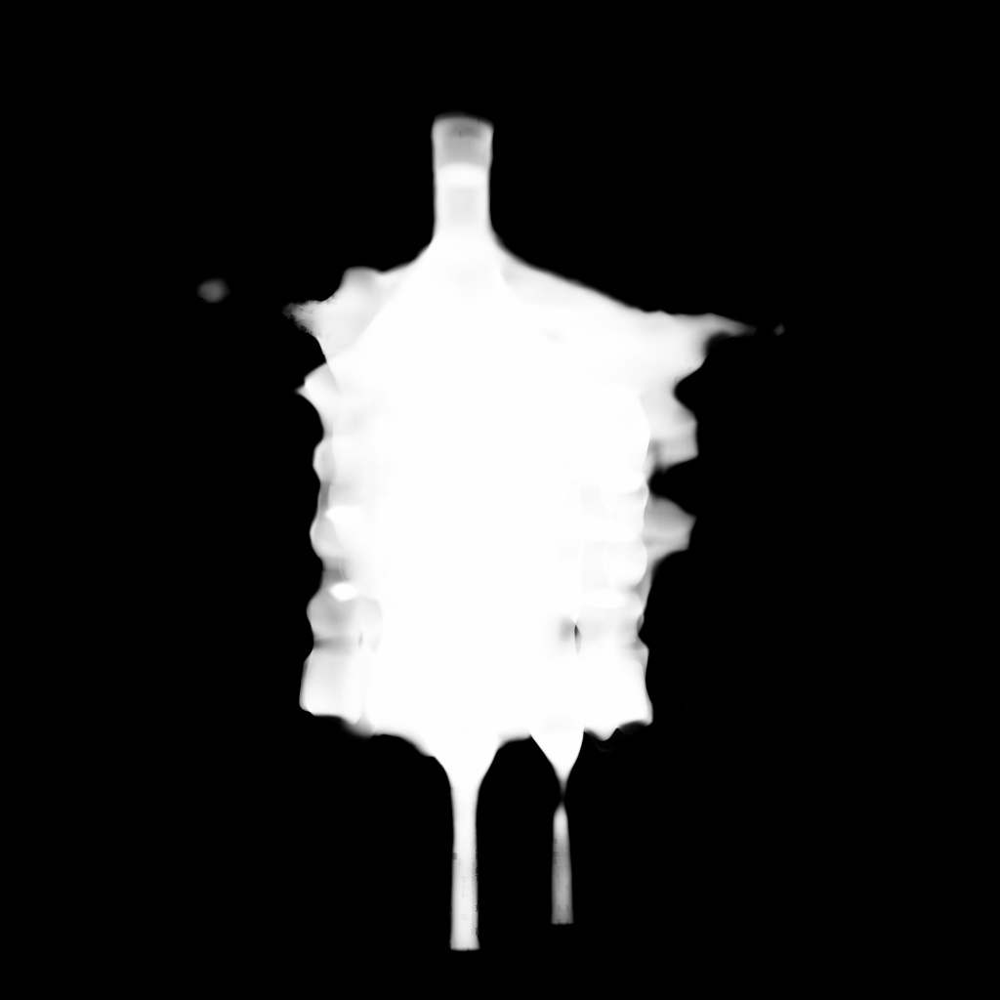
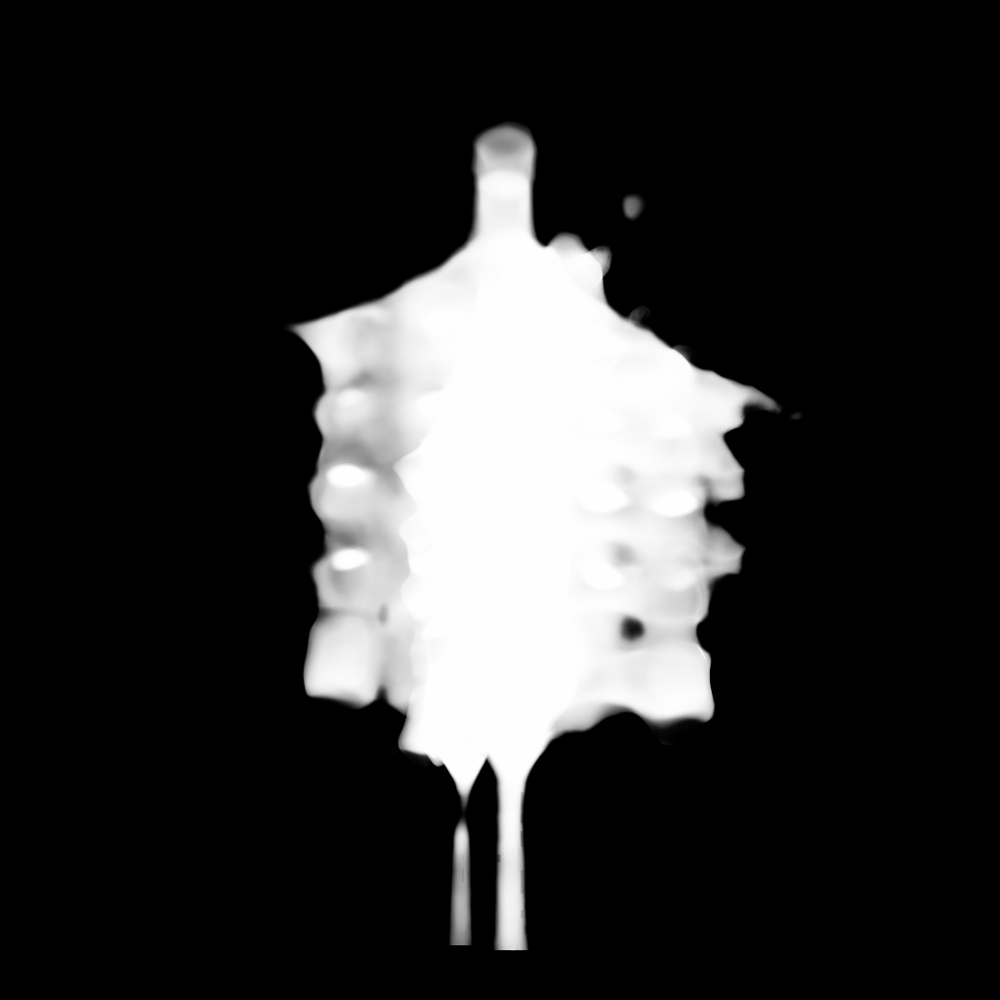
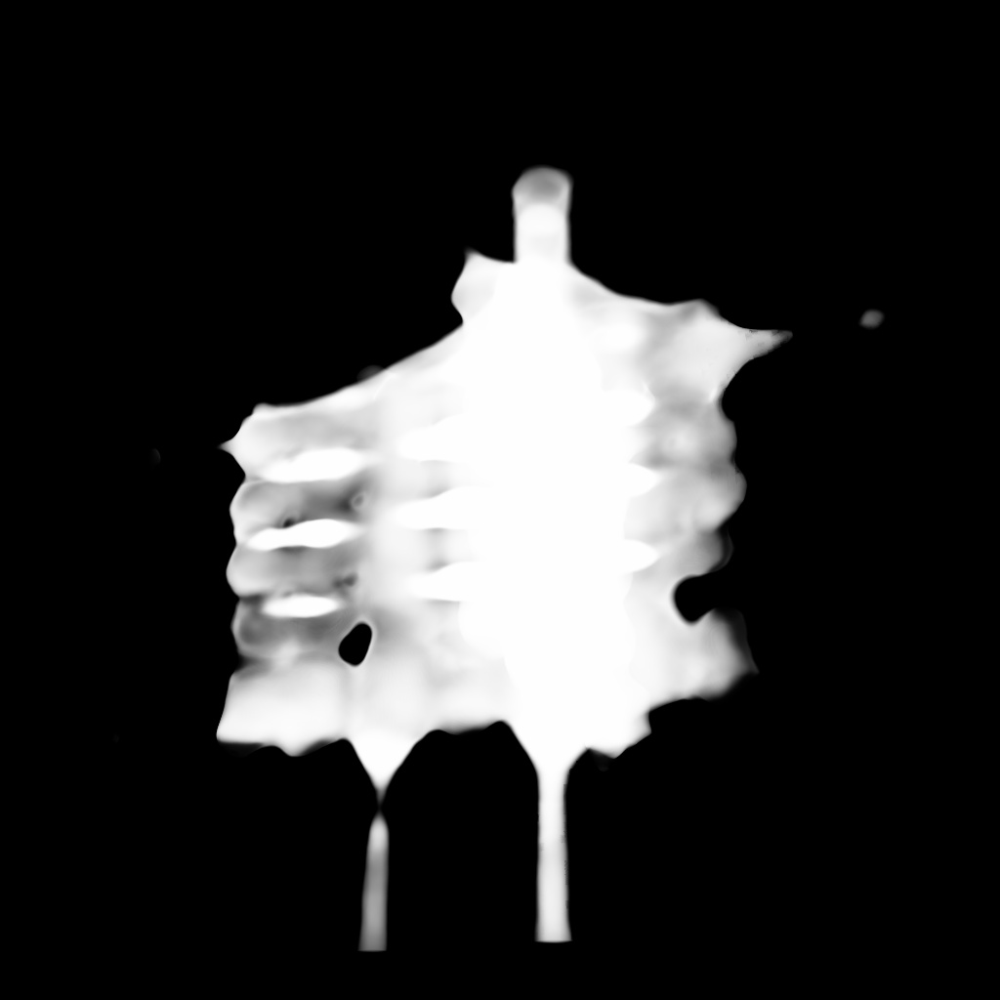
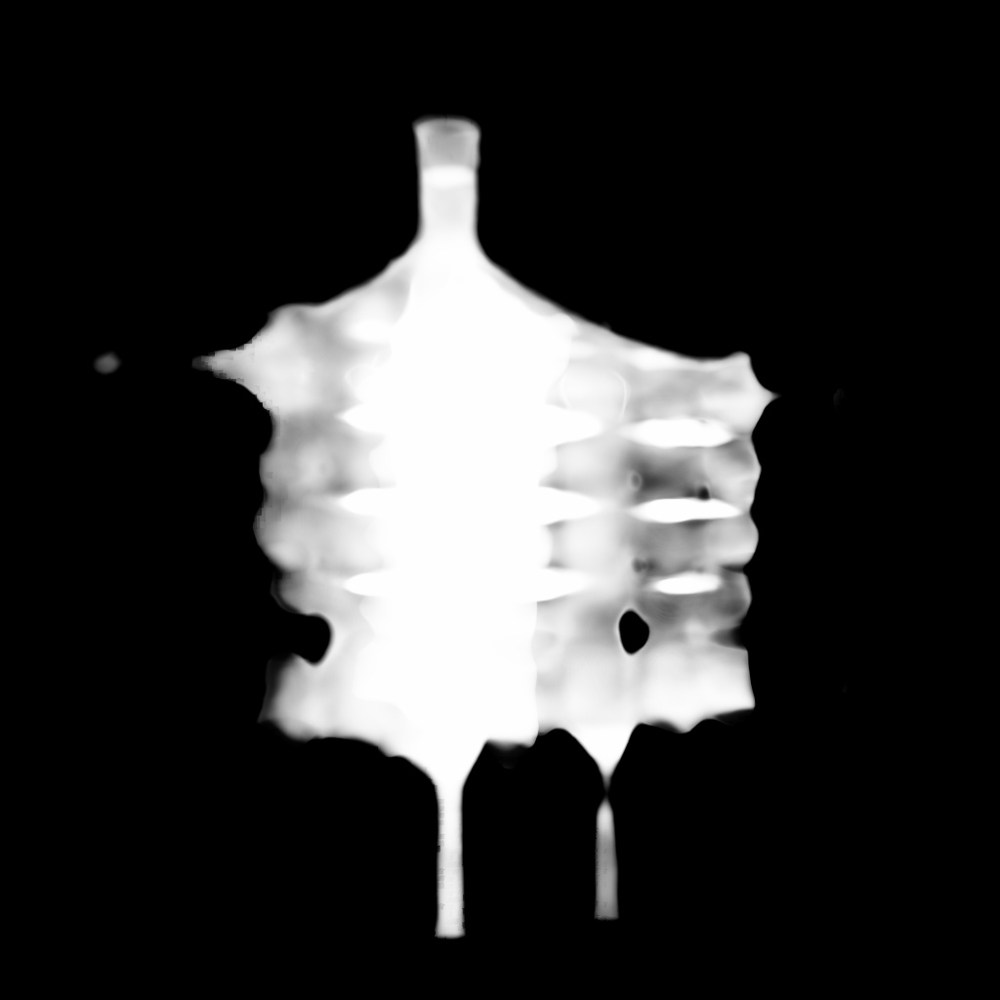

only show random 20 samples in colab. The rest out images could be found under project folder.

==> Finished Test.

100% 120/120 [00:54<00:00,  2.19it/s]

/content/dreamfields-3D


In [ ]:
#@title Testing
#@ markdown Will generate images and mesh output use the latest checkpoint, even when the training has not finished.
%cd {DC_dir}
%run main_nerf.py --text {Prompt_text} {Prompt_image} --cuda_ray --fp16 --iters {iteration} --seed {seed} \
--output_dir {output_dir} --workspace {workspace} --colab --val_int {display_interval} --w {clip_w_h} --h {clip_w_h} \
--H {render_W_H} --W {render_W_H} --fovy {camera_fovy} --clip_model {clip_model} --aug_copy {clip_aug_copy}  \
--ckpt_save_interval {ckpt_save_interval} {save_interval_img} {use_clip_dir_text} {clip_aug} --ckpt {ckpt} \
--test_samples {test_samples} --mesh_res {mesh_resolution} --mesh_trh {mesh_threshold}  {save_video} {save_mesh} \
--test
%cd {DC_dir}

In [ ]:
#@title display latest RGB video
from IPython.display import HTML
from base64 import b64encode
path2video =  f"{output_dir}/{workspace}/videos/" + get_latest_file (f"{output_dir}/{workspace}/videos/")
def show_video(video_path, video_width = 600):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")
 
show_video(path2video)